In [1]:
import pandas as pd
from IPython.display import display
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import numpy as np

from sklearn.cluster import Birch, AgglomerativeClustering, KMeans
from sklearn_extra.cluster import KMedoids
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from sklearn import metrics

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC, LinearSVC
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler, MaxAbsScaler, PowerTransformer
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_curve, roc_auc_score, plot_confusion_matrix
from sklearn.metrics import precision_recall_curve
from sklearn.model_selection import learning_curve

In [1]:
df = pd.read_csv('2.csv')

In [3]:
# The function performs an initial analysis of the dataset, 
# providing a brief overview of the data quality.

def first_look(df):
    # See head DataFrame
    print('Head of df:\n') 
    display(df.head())
    print('\n-----------------------------------------------\n')
    
    # Shape of df
    print('Df shape:\n')
    print(df.shape)
    print('\n-----------------------------------------------\n')
    
    # See Columns
    print('Name of columns:\n')
    print(df.columns.tolist())
    print('\n-----------------------------------------------\n')
    
    # Null values:
    print('Quantity of null values:\n')
    display(df.isnull().sum())
    print('\n-----------------------------------------------\n')
    
    # Duplicated values:
    print('Quantity of duplicated values:\n')
    display(df.duplicated().sum())
    print('\n-----------------------------------------------\n')
    
    # Variables information:
    print('Variables information:\n')
    display(df.info())
    print('\n-----------------------------------------------\n')

In [4]:
first_look(df)

Head of df:



,T-R Separation Distance (m),Time Delay (ns),Received Power (dBm),Phase (rad),Azimuth AoD (degree),Elevation AoD (degree),Azimuth AoA (degree),Elevation AoA (degree),Path Loss (dB),RMS Delay Spread (ns),Classes
0,55.1,265,-96.8,0.0,197,-3.0,173.7,14,125.8,25.3,0
1,55.1,267,-75.3,4.6,68,-8.8,247.6,8,105.3,2.9,1
2,55.1,268,-111.8,5.9,49,-21.0,157.5,-10,139.7,15.2,0
3,55.1,271,-90.4,1.1,56,-15.7,249.2,20,120.3,4.4,0
4,55.1,275,-93.7,5.4,70,-12.6,250.1,16,115.0,24.2,1



-----------------------------------------------

Df shape:

(4999, 11)

-----------------------------------------------

Name of columns:

['T-R Separation Distance (m)', 'Time Delay (ns)', 'Received Power (dBm)', ' Phase (rad)', 'Azimuth AoD (degree)', 'Elevation AoD (degree)', 'Azimuth AoA (degree)', 'Elevation AoA (degree)', 'Path Loss (dB)', 'RMS Delay Spread (ns)', 'Classes']

-----------------------------------------------

Quantity of null values:



T-R Separation Distance (m)    0
Time Delay (ns)                0
Received Power (dBm)           0
 Phase (rad)                   0
Azimuth AoD (degree)           0
Elevation AoD (degree)         0
Azimuth AoA (degree)           0
Elevation AoA (degree)         0
Path Loss (dB)                 0
RMS Delay Spread (ns)          0
Classes                        0
dtype: int64


-----------------------------------------------

Quantity of duplicated values:



18


-----------------------------------------------

Variables information:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4999 entries, 0 to 4998
Data columns (total 11 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   T-R Separation Distance (m)  4999 non-null   float64
 1   Time Delay (ns)              4999 non-null   int64  
 2   Received Power (dBm)         4999 non-null   float64
 3    Phase (rad)                 4999 non-null   float64
 4   Azimuth AoD (degree)         4999 non-null   int64  
 5   Elevation AoD (degree)       4999 non-null   float64
 6   Azimuth AoA (degree)         4999 non-null   float64
 7   Elevation AoA (degree)       4999 non-null   int64  
 8   Path Loss (dB)               4999 non-null   float64
 9   RMS Delay Spread (ns)        4999 non-null   float64
 10  Classes                      4999 non-null   int64  
dtypes: float64(7), int64(4)
memory usage: 429.7 KB


None


-----------------------------------------------



# 2. Data clean:

Upon initial inspection, the dataset appears to be in good shape with consistent data types and no missing values. It consists of 4999 observations and 11 variables. However, 18 duplicate values were identified and will be removed to maintain data quality and algorithm performance.

In [5]:
df = df.drop_duplicates()

print('Quantity of duplicated values:\n')
print(df.duplicated().sum())

Quantity of duplicated values:

0


# EDA:

Next, we will perform Exploratory Data Analysis (EDA). Firstly, we define several functions such as boxplot_variables, piechart, kdeplot_num, and Scatter3D to facilitate the creation of visualizations. Then, the EDA function provides a comprehensive report with various charts to gain a better understanding of the data. At the end of this section, we extract and document significant characteristics of the data, aiming to gain a comprehensive understanding of its key features and patterns.

In [6]:
def boxplot_variables(df):
    """
    Generate boxplots for each variable in the dataset 
    using Plotly.

    Arguments:
    - df: The dataset containing the variables.

    Returns:
    - fig: The Plotly figure displaying the boxplots.
    """

    # Create a Plotly figure
    fig = go.Figure()

    # Add boxplots for all variables
    for col in df.columns:
        fig.add_trace(go.Box(y=df[col], name=col, showlegend=False))

    # Adjust the size of the graph
    fig.update_layout(height=750, width=800)

    # Update the title and subtitle of the graph
    fig.update_layout(
        title={
            'text': 'Boxplot Analysis',
            'y': 0.95,
            'x': 0.5,
            'xanchor': 'center',
            'yanchor': 'top'
        },
        annotations=[
            dict(
                text='If you are viewing this in an ipynb file, feel free to hover over the graph to see more details',
                showarrow=False,
                xref='paper',
                yref='paper',
                x=0.5,
                y=1.07,
                font=dict(size=12)
            )
        ]
    )

    # Update the x and y axis labels
    fig.update_layout(xaxis_title='Variables', yaxis_title='Values')

    # Update the y-axis layout
    fig.update_yaxes(tickfont=dict(size=7))
    fig.show()

    # Show the graph
    return fig

In [7]:

def piechart(df, classes):
    """
    Generate a pie chart to represent the distribution of a categorical variable in a dataset.

    Arguments:
    - df: The dataset containing the variable.
    - classes: The name of the categorical variable.

    Returns:
    - fig: The generated matplotlib figure.
    """

    # Count the occurrences of each class in the categorical variable
    class_counts = df[classes].value_counts()

    # Define custom colors and rotation
    colors = ['#FF7F0E', '#1F77B4']  # Specify custom colors for the pie chart
    rotation = 65  # Specify rotation angle for the pie chart

    # Set the separation between colors
    wedgeprops = {'linewidth': 2, 'edgecolor': 'white'}

    # Create a pie plot with custom colors, rotation, and wedge properties
    fig, ax = plt.subplots(figsize=(6, 6), facecolor='white')
    ax.pie(class_counts, labels=class_counts.index, autopct='%1.1f%%', colors=colors, startangle=rotation, wedgeprops=wedgeprops)
    ax.set_title(f'Distribution of {classes} variable', size=15)

    plt.show()

    return fig

In [8]:
def kdeplot_num(df, classes):
    """
    Generate KDE plots to compare numerical variables with a dichotomous variable in the given DataFrame.

    Arguments:
    - df: The DataFrame containing the variables.
    - classes: The name of the dichotomous variable.

    Returns:
    - fig: The generated matplotlib figure.
    """

    # Variables
    variables = list(df.iloc[:,:-1].columns)

    # Create a subplot with the desired size
    fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(12, 20))

    # Flatten the axes array
    axes = np.array(axes).flatten()

    # Comparison of each numerical variable with respect to the dichotomous variable
    for i, var in enumerate(variables):
        sns.kdeplot(data=df, x=var, hue=classes, ax=axes[i])
        axes[i].set_title(f'Comparison of {var} by {classes}')
        axes[i].set_xlabel(var)
        axes[i].set_ylabel('Density')

    # Adjust the spacing between titles and x-axis labels
    plt.subplots_adjust(hspace=0.4)
    plt.show()

    return fig

In [9]:
def Scatter3D(var1, var2, var3, color, name1, name2, name3):
    """
    Generate a 3D scatter plot to compare three selected variables.

    Arguments:
    - var1: The values of the first variable.
    - var2: The values of the second variable.
    - var3: The values of the third variable.
    - color: The color of the markers.

    Returns:
    - fig: The generated Plotly figure.
    """

    # Create the three-dimensional figure
    fig = go.Figure(data=[go.Scatter3d(x=var1, y=var2, z=var3, mode='markers',
                                       marker=dict(size=2, color=color))])

    # Customize the figure size
    fig.update_layout(width=600, height=500)
    
    # Customize the layout of the graph
    fig.update_layout(scene=dict(
        xaxis_title=name1,
        yaxis_title=name2,
        zaxis_title=name3,
        xaxis=dict(title_font=dict(size=10), tickfont=dict(size=9)),
        yaxis=dict(title_font=dict(size=10), tickfont=dict(size=9)),
        zaxis=dict(title_font=dict(size=10), tickfont=dict(size=9))
    ))

    # Change the title of the graph
    fig.update_layout(title='Comparison of 3 selected variables')
    fig.show()

    return fig

Descriptive Statistics:



,T-R Separation Distance (m),Time Delay (ns),Received Power (dBm),Phase (rad),Azimuth AoD (degree),Elevation AoD (degree),Azimuth AoA (degree),Elevation AoA (degree),Path Loss (dB),RMS Delay Spread (ns),Classes
count,4981.000000,4981.000000,4981.000000,4981.000000,4981.000000,4981.000000,4981.000000,4981.000000,4981.000000,4981.000000,4981.000000
mean,41.374664,418.612728,-111.388717,3.194700,222.227264,-15.157197,163.183537,12.558121,117.283497,27.201867,0.570970
std,7.816196,268.758396,32.998168,1.837682,83.234163,7.698352,104.318439,14.210399,15.151069,25.004153,0.494987
min,33.900000,112.000000,-160.000000,0.000000,0.000000,-65.600000,0.000000,-38.000000,71.900000,0.000000,0.000000
25%,35.900000,213.000000,-142.500000,1.600000,151.000000,-19.800000,81.000000,3.000000,106.800000,7.300000,0.000000
50%,38.100000,352.000000,-106.600000,3.300000,252.000000,-16.000000,151.000000,12.000000,117.400000,19.700000,1.000000
75%,42.900000,542.000000,-83.400000,4.800000,291.000000,-11.400000,244.300000,21.000000,127.600000,41.100000,1.000000
max,58.400000,1581.000000,-41.900000,6.300000,360.000000,10.800000,359.900000,105.000000,159.300000,145.900000,1.000000



-----------------------------------------------

Mean of each variable by class:



Classes,0,1
Phase (rad),3.106972,3.260619
Azimuth AoA (degree),175.076743,154.246906
Azimuth AoD (degree),221.488535,222.782349
Elevation AoA (degree),13.822181,11.608298
Elevation AoD (degree),-14.312822,-15.791667
Path Loss (dB),131.329340,106.729360
RMS Delay Spread (ns),40.708610,17.052813
Received Power (dBm),-129.599813,-97.704782
T-R Separation Distance (m),43.376790,39.870253
Time Delay (ns),512.572298,348.010900



-----------------------------------------------

Correlation Plot:



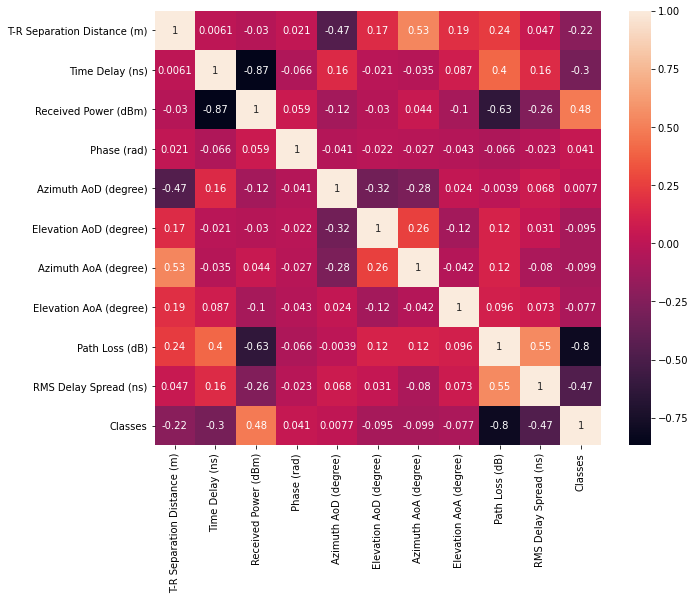


-----------------------------------------------

Piechart of binary variable:



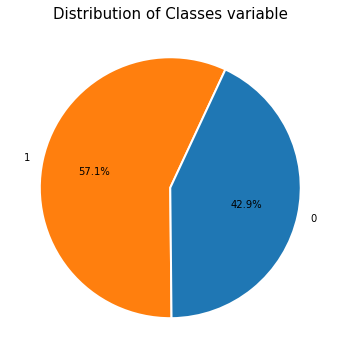


-----------------------------------------------

Boxplot analysis:



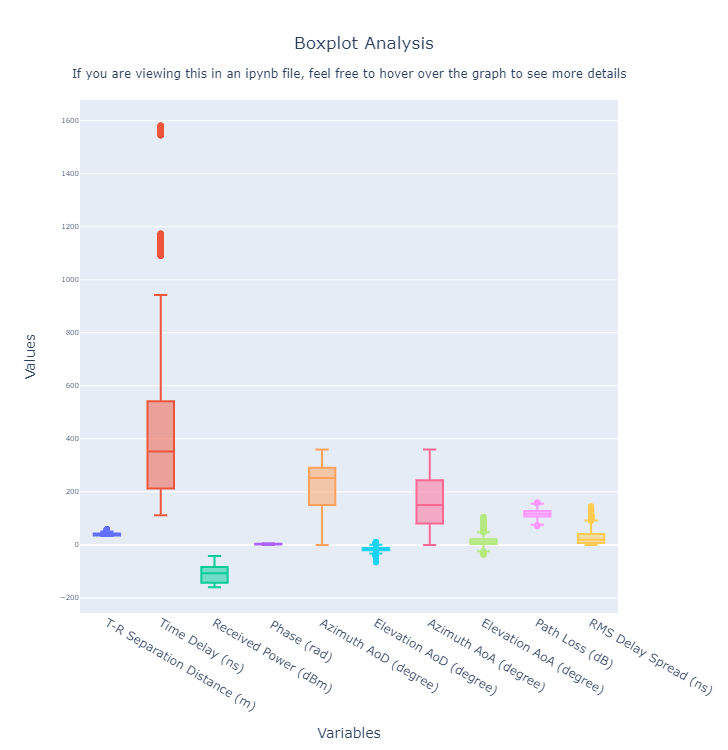


-----------------------------------------------

Comparison between classes in each variable:



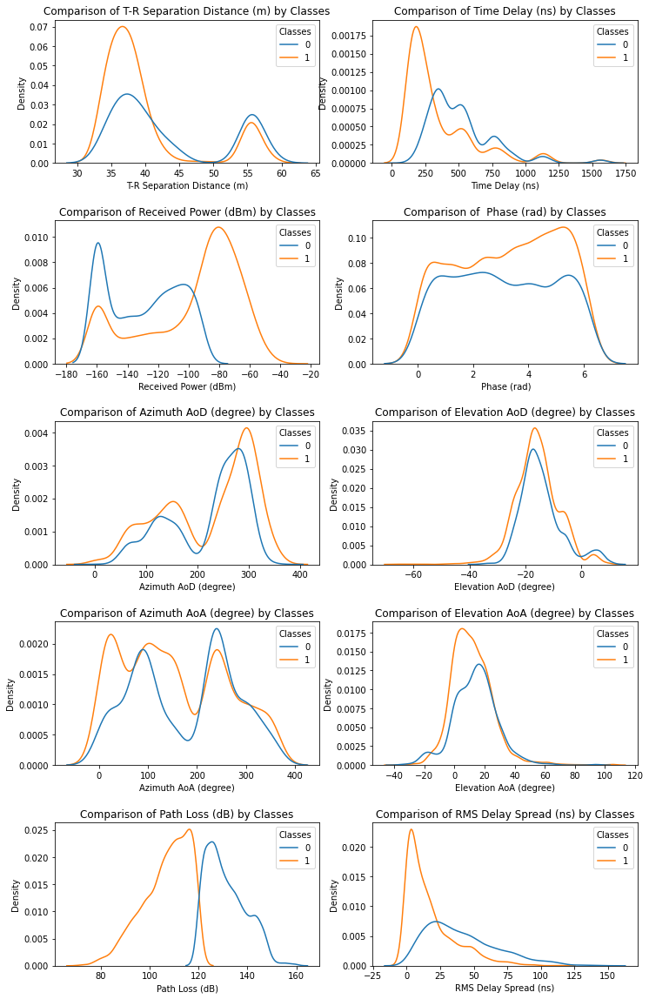


-----------------------------------------------

Comparison between 3 variables:



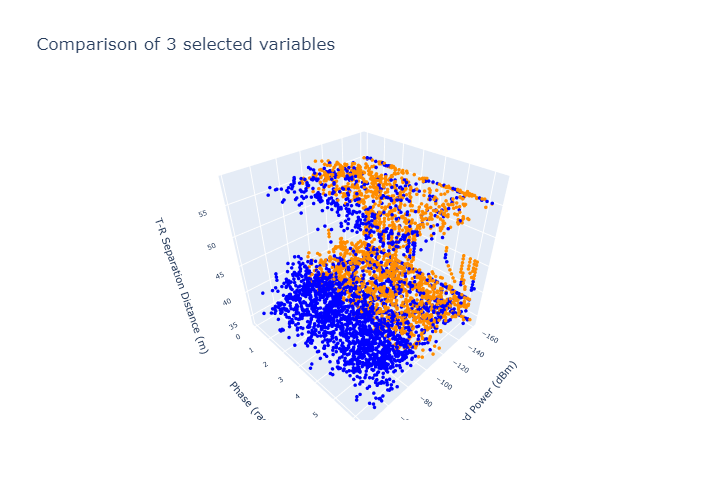


-----------------------------------------------



In [10]:
def EDA(df, classes):
    """
    Perform exploratory data analysis (EDA) on a given DataFrame.

    Arguments:
    - df: The DataFrame to perform EDA on.
    - classes: The name of the column containing the classes.

    Returns:
    None (displays EDA results).
    """

    # Descriptive stats
    print('Descriptive Statistics:\n')
    display(df.describe())
    print('\n-----------------------------------------------\n')

    # Mean of each variable by class
    print('Mean of each variable by class:\n')
    selected_vars = df.columns[:-1].tolist()  # Exclude the last column 'Classes'

    # Create dynamic table
    table = pd.pivot_table(df, values=selected_vars, index=classes, aggfunc='mean')
    display(table.transpose())
    print('\n-----------------------------------------------\n')

    # Correlation plot
    print('Correlation Plot:\n')
    plt.figure(figsize=(10, 8))  # Size in inches (width x height)
    sns.heatmap(df.corr(), annot=True)
    plt.show()
    print('\n-----------------------------------------------\n')

    # Piechart
    print('Piechart of binary variable:\n')
    piechart(df, classes)  # Use piechart function
    print('\n-----------------------------------------------\n')

    # Boxplot analysis
    print('Boxplot analysis:\n')
    df_aux = df.iloc[:, :-1]  # Delete classes variable
    boxplot_variables(df_aux)  # Use boxplot_variables function
    print('\n-----------------------------------------------\n')

    # Comparison numerical variables
    print('Comparison between classes in each variable:\n')
    kdeplot_num(df, classes)  # Use kdeplot_num function
    print('\n-----------------------------------------------\n')

    # Make 3D comparative graph.
    # You can change variables as you want.
    print('Comparison between 3 variables:\n')

    # Define colors for each class
    colors = {0: 'darkorange', 1: 'blue'}
    color_categories = [colors[c] for c in df[classes]]

    var1 = df['Received Power (dBm)']
    var2 = df[' Phase (rad)']
    var3 = df['T-R Separation Distance (m)']
    
    name1 = var1.name
    name2 = var2.name
    name3 = var3.name
    # Use Scatter3D function
    Scatter3D(var1, var2, var3, color_categories, name1, name2, name3)
    print('\n-----------------------------------------------\n')

EDA(df, 'Classes')

When examining the descriptive statistics, we observed consistent data quantities. We noted that Time Delay, Azimuth AoA (degree), and Azimuth AoD (degree) exhibit the highest variability, with standard deviations of 268.75, 104.31, and 83.23, respectively.

Furthermore, when observing the means of each variable across the classes, we noticed that, in general, Class 0 has larger data values compared to Class 1. However, the variables Phase (rad), Azimuth AoD (degree), and Received Power (dBm) are exceptions to this trend. Notably, the most significant mean differences occur in the Time Delay (ns), Received Power (dBm), and Azimuth AoA (degree) variables. This suggests that among these variables, the mean values of Class 0 and Class 1 are more distinct compared to the other variables.

In the correlation graph, we observed that the relationships between Received Power and Time Delay, Path Loss and classes, and Path Loss and Received Power are the most notable. These relationships are negative, with correlation values of -0.87, -0.8, and -0.69, respectively. It is important to consider that variables with stronger correlations may provide redundant information to the model and potentially introduce multicollinearity issues.

Moving on to the pie chart, Class 1 represents 57.1% of the data, while the remaining data belongs to Class 0.

The box plot provides insights into data concentration. It is noteworthy that Time Delay, Azimuth AoD, and Azimuth AoA exhibit a wider range of values compared to other variables, confirming their high variability. Additionally, we observed that the Received Power variable consists solely of negative values.

Furthermore, in the KDE plot, we noticed that the dispersion of the classes is generally similar across each variable. However, in the case of the Path Loss variable, Class 0 exhibits higher values.

Lastly, in the final graph, we can visualize the 3D dispersion of three variables.

# Regression models:

In this section, regression models such as logistic regression, random forest, SVC, LinearSVC, XGBClassifier, and KNeighbors are applied. The quality of these models is evaluated using metrics such as precision, accuracy, recall, and F1 score. Additionally, ROC curves, precision-recall curves, and learning curves are plotted to assess model performance.

- **Learning curve:** The Learning Curve demonstrates the relationship between the model's performance (measured by a accuracy) and the size of the training dataset. It helps assess if the model would benefit from additional training data or if it has reached its maximum potential.

- **Accuracy:** Represents the overall ability of the model to make correct predictions. A high accuracy value indicates that the model has a high rate of overall correct predictions.

$$Accuracy = \frac{(True Positives + True Negatives)}{(True Positives + True Negatives + False Positives + False Negatives)}$$

- **Precisión:**  It is the model's ability to avoid misclassifying negative instances as positive. A high precision value indicates that the model has a low rate of false positives.

$$Precision = \frac{True Positives}{(True Positives + False Positives)}$$

- **Recall:** Represents the model's ability to correctly identify positive instances. A high recall value indicates that the model has a low rate of false negatives and is able to identify most of the positive instances.

$$Recall = \frac{True Positives}{(True Positives + False Negatives)}$$

- **F1-Score:** It is a general measure of the model's precision, considering both the ability to avoid false positives and false negatives. A high F1 score indicates a good balance between precision and recall.

$$F1-Score = \frac{2 * Precision * Recall}{(Precision + Recall)}$$

- **ROC Curve:** The Receiver Operating Characteristic (ROC) curve illustrates the performance of a binary classification model at various classification thresholds. It is created by plotting the true positive rate (Recall) against the false positive rate (1 - Specificity) across different thresholds.

- **Precicision-Recall Curve:** The Precision-Recall curve visualizes the trade-off between precision and recall at different classification thresholds. It plots precision on the y-axis and recall on the x-axis.

Initially, functions are created to efficiently apply the models and display the metrics. Then, a brief description of each model's functioning is provided. Finally, the results of the regression models are discussed and analyzed.

In [11]:
from sklearn.model_selection import learning_curve

def get_metrics_binary(classifier, y_test, y_pred, X_train, y_train):
    """
    Function that calculates evaluation metrics for a binary classification
    algorithm, generates the metrics table, and displays ROC, Precision-Recall,
    learning curve, and confusion matrix plots.

    Inputs:
    - classifier: Classification estimator.
    - X_test: Feature matrix of the test set.
    - y_test: Target variable vector in the test set.
    - y_pred: Predicted target variable vector in the test set.
    - X_train: Feature matrix of the training set.
    - y_train: Target variable vector in the training set.

    Outputs:
    - metrics: Table with classifier metrics.
    - cm_df: Confusion matrix DataFrame.
    - train_scores: Training scores from the learning curve.
    - test_scores: Test scores from the learning curve.
    - roc_auc: Area under the ROC curve.

    """
    
    
    # Compute and plot the learning curve
    print('Learning curve: \n')
    train_sizes, train_scores, test_scores = learning_curve(classifier, 
                                                            X_train, y_train, cv=5)
    train_scores_mean = np.mean(train_scores, axis=1)
    plt.figure(figsize=(8, 6))
    plt.plot(train_sizes, train_scores_mean, 'o-', label='Training Accuracy')
    plt.xlabel('Training Examples')
    plt.ylabel('Accuracy')
    plt.title('Learning Curve')
    plt.legend(loc="lower right")
    plt.show()
    
    # Save learning curve values
    class_name = [f'{classifier.__class__.__name__}',
        f'{classifier.__class__.__name__}',
        f'{classifier.__class__.__name__}',
        f'{classifier.__class__.__name__}',
        f'{classifier.__class__.__name__}']    
    
    df_learning_curve = {
    'model': class_name,
    'train_sizes': train_sizes,
    'train_scores': train_scores_mean
    }
    
    df_learning_curve = pd.DataFrame(df_learning_curve)
    print('\n------------------------------------------------------------\n')
    
    # Compute and display the confusion matrix
    print('Confussion matrix: \n')
    cm = confusion_matrix(y_test, y_pred)
    cm_df = pd.DataFrame(cm, index=['Actual Negative', 'Actual Positive'], 
                         columns=['Predicted Negative', 'Predicted Positive'])
    
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm_df, annot=True, fmt='d', cmap='Blues')
    plt.title('Confusion Matrix')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.show()
    print('\n------------------------------------------------------------\n')
    
    # Calculate metrics
    print('Relevant metrics: \n')
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    
    # Create metrics table
    df_metrics = {
        'Accuracy': accuracy,
        'Precision': precision,
        'Recall': recall,
        'F1-Score': f1,
        'ROC-Area': roc_auc_score(y_test, y_pred)
    }
    df_metrics = pd.DataFrame(df_metrics, index=[f'{classifier.__class__.__name__}'])
    display(df_metrics)
    print('\n------------------------------------------------------------\n')
    
    # Compute and plot the ROC curve
    print('ROC and precision-recall curve:\n')
    fpr, tpr, thresholds = roc_curve(y_test, y_pred)
    roc_auc = roc_auc_score(y_test, y_pred)

    # Create subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
    
    # Plot ROC curve
    ax1.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
    ax1.plot([0, 1], [0, 1], 'k--')
    ax1.set_xlim([0.0, 1.0])
    ax1.set_ylim([0.0, 1.05])
    ax1.set_xlabel('False Positive Rate')
    ax1.set_ylabel('True Positive Rate')
    ax1.set_title('Receiver Operating Characteristic')
    ax1.legend(loc="lower right")
    
    # Compute and plot the Precision-Recall curve
    
    precision, recall, _ = precision_recall_curve(y_test, y_pred)
    
    # Plot Precision-Recall curve
    ax2.plot(recall, precision, label='Precision-Recall curve')
    ax2.set_xlabel('Recall')
    ax2.set_ylabel('Precision')
    ax2.set_title('Precision-Recall Curve')
    ax2.legend(loc="lower right")
    
    # Adjust the spacing between subplots
    plt.tight_layout()
    
    # Show the plot
    plt.show()
   
    
    # Save presicion-recall curve values

    
    df_prc = {
    'precision': precision,
    'recall': recall}
    df_prc = pd.DataFrame(df_prc)
    
    
    # Save auc curve values
    class_name = [f'{classifier.__class__.__name__}',
                 f'{classifier.__class__.__name__}',
                 f'{classifier.__class__.__name__}']    
    df_roc = {
    'model': class_name,
    'fpr': fpr,
    'tpr': tpr,
    'roc-auc': roc_auc
    }
    df_roc = pd.DataFrame(df_roc)
    
    print('\n------------------------------------------------------------\n')
    
    
    return df_metrics, cm_df, df_learning_curve, df_roc, df_prc

In [12]:
def apply_classifier(X_train, X_test, y_train, classifier_name):
    """
    Apply a classification algorithm to the training data and make predictions on the test data.

    Inputs:
    - X_train: Feature matrix of the training set.
    - X_test: Feature matrix of the test set.
    - y_train: Target variable vector in the training set.
    - num_clusters: Number of clusters for the KMeans algorithm.
    - classifier_name: Name of the classifier to use.

    Outputs:
    - y_pred: Predicted target variable vector in the test set.
    - classifier: Object of the used classifier.

    """

    # Initialize the model
    if classifier_name == "LogisticRegression":
        classifier = LogisticRegression()
    elif classifier_name == "RandomForestClassifier":
        classifier = RandomForestClassifier()
    elif classifier_name == "SVC":
        classifier = SVC()
    elif classifier_name == "LinearSVC":
        classifier = LinearSVC()
    elif classifier_name == "XGBClassifier":
        classifier = XGBClassifier()
    elif classifier_name == "KNeighborsClassifier":
        classifier = KNeighborsClassifier()
    else:
        print("Classifier not supported.")
        return

    # Fit the classifier using the training data
    classifier.fit(X_train, y_train)
    
    # Make predictions on the test data
    y_pred = classifier.predict(X_test)
    
    return y_pred, classifier

In [13]:
def apply_classification_pipeline(X, y, scaler_name, classifier_name):
    """
    Apply a classification pipeline that includes data standardization,
    train-test split, and the application of a specific classifier.

    Inputs:
    - X: Feature matrix.
    - y: Target variable vector.
    - scaler_name: Name of the scaler to use.
    - num_clusters: Number of clusters.
    - classifier_name: Name of the classifier to use.

    Output:
    - metrics: Table with the classifier metrics.
    - cm_df: DataFrame of the confusion matrix.
    - roc_auc: Area under the ROC curve.
    - y_pred: Vector of predicted values for the target variable.
    """

    # Data standardization
    if scaler_name == "StandardScaler":
        scaler = StandardScaler()
    elif scaler_name == "MinMaxScaler":
        scaler = MinMaxScaler()
    elif scaler_name == "RobustScaler":
        scaler = RobustScaler()
    elif scaler_name == "MaxAbsScaler":
        scaler = MaxAbsScaler()
    elif scaler_name == "PowerTransformer":
        scaler = PowerTransformer()
    else:
        print("Scaler not supported.")
        return

    X_scaled = scaler.fit_transform(X)  # Apply data standardization to the input data X

    # Train-test split
    X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

    # Call the apply_classifier function to apply the machine learning model on the training set
    y_pred, classifier = apply_classifier(X_train, X_test, y_train, classifier_name)

    # Obtain the metrics of the model on the test set by calling the get_metrics_binary function
    df_metrics, cm_df, df_learning_curve, df_roc, df_prc = get_metrics_binary(classifier, y_test, y_pred, X_train, y_train)

    return df_metrics, cm_df, df_learning_curve, df_roc, df_prc, y_pred

In [14]:
X = df.drop('Classes', axis=1)
y = df['Classes']
scaler_name = 'StandardScaler'

## Logistic Regression

Logistic regression is an algorithm used for binary classification problems. It estimates the probability of an instance belonging to a particular class using a logistic function. The logistic function is defined as:

$$ f(x) = \frac{1}{1 + e^{-z}} $$

where z is a linear combination of the predictor variables:

$$ z = \beta_0 + \beta_1x_1 + \beta_2x_2 + \ldots + \beta_nx_n $$

Here, $\beta_0, \beta_1, \ldots, \beta_n$ are the coefficients of the regression to be estimated. The logistic function transforms the value of z into a range between 0 and 1, which is interpreted as the probability of the instance belonging to the positive class.

To estimate the regression coefficients $\beta$, the maximum likelihood method is used. The goal is to maximize the likelihood function, which is defined as the probability of observing the training data given the model.

Once the coefficients have been estimated, logistic regression can be used to make predictions. If the estimated probability $f(x)$ is greater than a predetermined threshold (usually 0.5), the instance is classified as positive; otherwise, it is classified as negative.

Learning curve: 



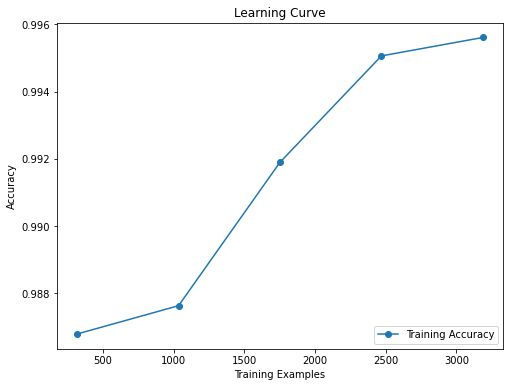


------------------------------------------------------------

Confussion matrix: 



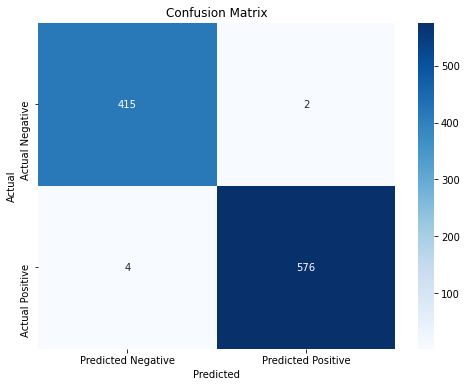


------------------------------------------------------------

Relevant metrics: 



,Accuracy,Precision,Recall,F1-Score,ROC-Area
LogisticRegression,0.993982,0.99654,0.993103,0.994819,0.994154



------------------------------------------------------------

ROC and precision-recall curve:



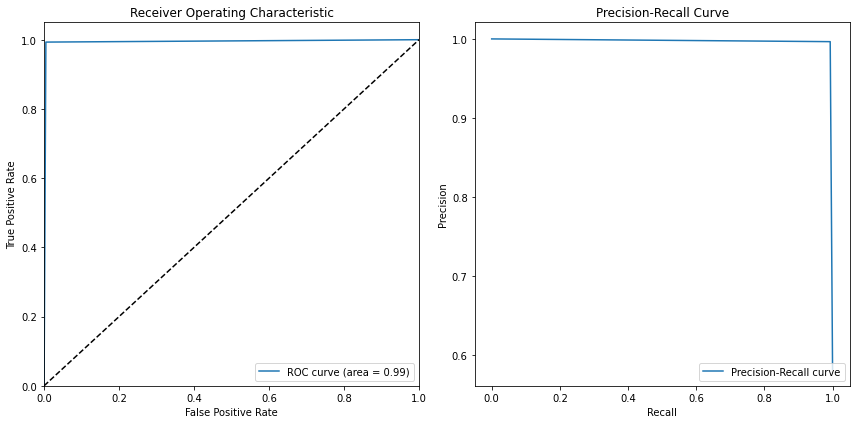


------------------------------------------------------------



In [15]:
classifier_name = 'LogisticRegression'
df_metrics_log, cm_df, df_learning_curve_log, df_roc_log, df_prc_log, y_pred = apply_classification_pipeline(X, y, scaler_name, classifier_name)

## Random Forest:

Random Forest is an ensemble learning method that combines multiple decision trees to make predictions. It uses a technique called bagging (bootstrap aggregating) to create an ensemble of decision trees.

The Random Forest algorithm works as follows:

Randomly select a subset of the training data (with replacement) to create a bootstrap sample.
Build a decision tree using the bootstrap sample by recursively splitting the data based on different features and feature thresholds.
At each node, randomly select a subset of features to consider for splitting.
Repeat steps 1-3 to create a specified number of decision trees.
To make a prediction, each decision tree in the forest independently predicts the class label (for classification) or the target value (for regression). The final prediction is determined by majority voting (for classification) or averaging (for regression) the predictions of all the trees.
The Random Forest algorithm combines the predictions of multiple decision trees, which helps to reduce overfitting and improve generalization performance. It also provides estimates of feature importance based on the average impurity decrease (or other measure) caused by each feature across all trees.

The mathematical formula for the prediction of a Random Forest classifier is given by:

$$ \hat{y} = \text{mode}(C_1, C_2, ..., C_n) $$

where $\hat{y}$ is the predicted class label, and $C_1, C_2, ..., C_n$ are the class labels predicted by each decision tree in the forest.

Learning curve: 



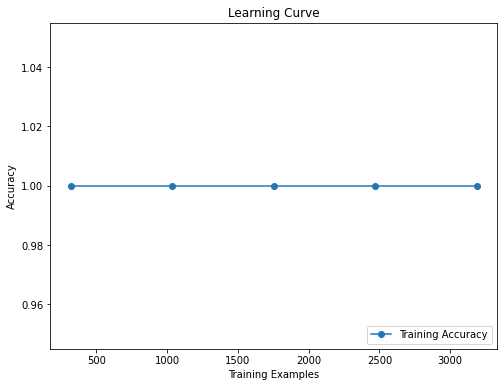


------------------------------------------------------------

Confussion matrix: 



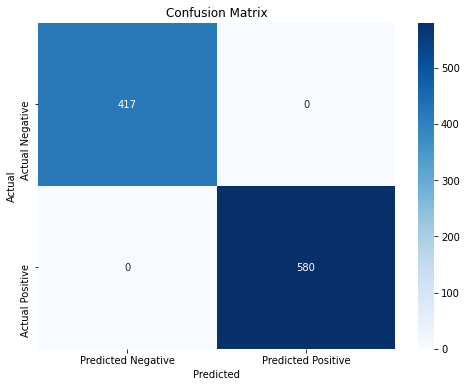


------------------------------------------------------------

Relevant metrics: 



,Accuracy,Precision,Recall,F1-Score,ROC-Area
RandomForestClassifier,1.0,1.0,1.0,1.0,1.0



------------------------------------------------------------

ROC and precision-recall curve:



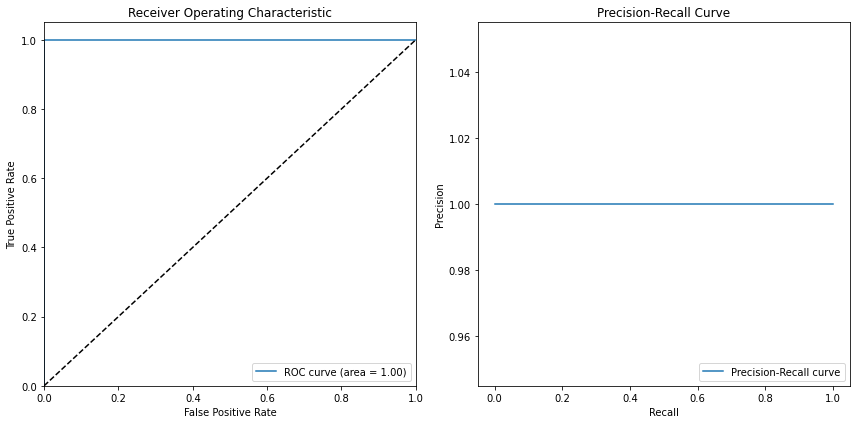


------------------------------------------------------------



In [16]:
classifier_name = 'RandomForestClassifier'
df_metrics_rf, cm_df, df_learning_curve_rf, df_roc_rf, df_prc_rf, y_pred = apply_classification_pipeline(X, y, scaler_name, classifier_name)

## SVC:

SVC, or Support Vector Classifier, is a supervised learning algorithm used for classification problems. It is based on the idea of finding a hyperplane in a higher-dimensional space that best separates the data classes.

In its simplest form, SVC solves a quadratic optimization problem to find the coefficients of the decision function. The decision function for a new point is calculated using:

$$ f(x) = \text{sign}\left(\sum_{i=1}^{n} \alpha_i y_i K(x_i, x) + b\right) $$

where x is the new point to classify, $x_i$ are the support vectors, $y_i$ are the class labels corresponding to the support vectors, $K(x_i, x)$ is the kernel function that measures the similarity between the support vectors and the new point, $α_i$ are the coefficients obtained during training, and $b$ is the bias term.

Learning curve: 



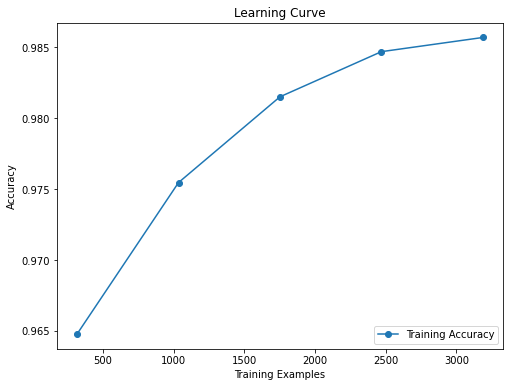


------------------------------------------------------------

Confussion matrix: 



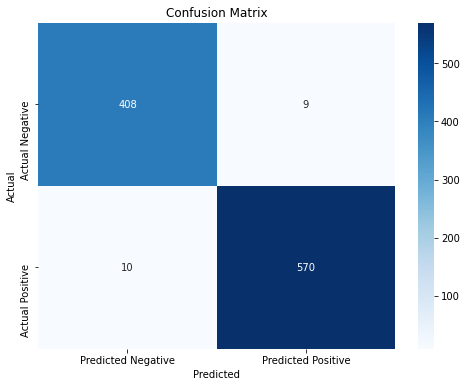


------------------------------------------------------------

Relevant metrics: 



,Accuracy,Precision,Recall,F1-Score,ROC-Area
SVC,0.980943,0.984456,0.982759,0.983607,0.980588



------------------------------------------------------------

ROC and precision-recall curve:



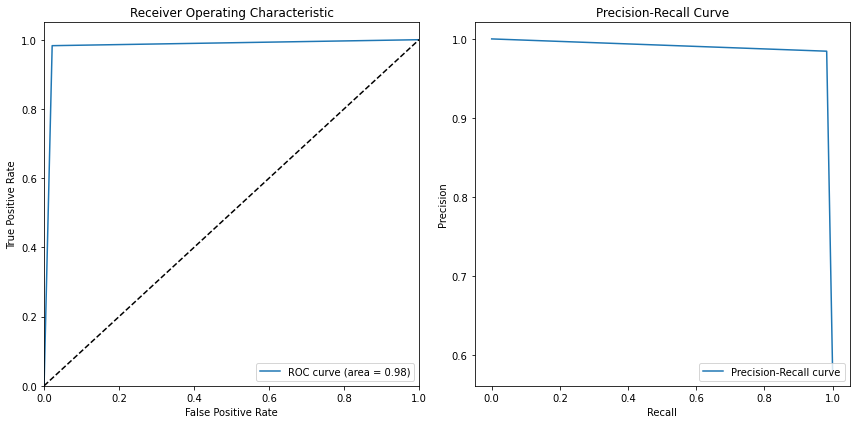


------------------------------------------------------------



In [17]:
classifier_name = 'SVC'
df_metrics_svc, cm_df, df_learning_curve_svc, df_roc_svc, df_prc_svc, y_pred = apply_classification_pipeline(X, y, scaler_name, classifier_name)

## LinearSVC

Linear SVC is a variant of the Support Vector Classifier algorithm that uses a linear kernel function for classification tasks. It aims to find the best hyperplane that separates the data classes while maximizing the margin.

The decision function for Linear SVC is given by:
    
$$ f(x) = \text{sign}\left(\sum_{i=1}^{n} \alpha_i y_i \langle x_i, x \rangle + b\right) $$

where $x$ is the input point to classify, $x_i$ are the support vectors, y_i are the class labels corresponding to the support vectors, $α_i$ are the coefficients obtained during training, and $b$ is the bias term.

The linear kernel function used in Linear SVC is simply the dot product between two vectors:

$$ \langle x_i, x \rangle = \sum_{j=1}^{m} x_{ij} x_j $$

where $x_{ij}$ and $x_j$ represent the components of the input vectors $x_i$ and $x$, respectively.

Linear SVC aims to find the optimal values of the coefficients $α_i$ and bias term b that define the hyperplane separating the classes. The optimization process involves solving a convex quadratic programming problem.

Learning curve: 



C:\Users\Bastian Barraza M\anaconda3\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.



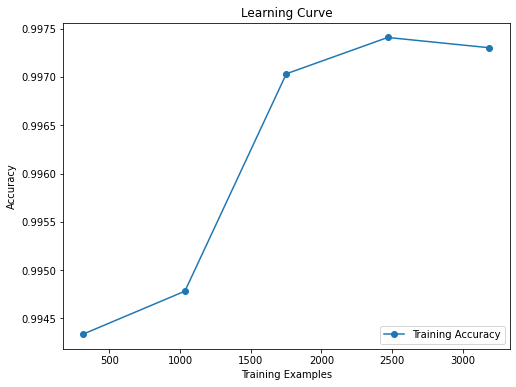


------------------------------------------------------------

Confussion matrix: 



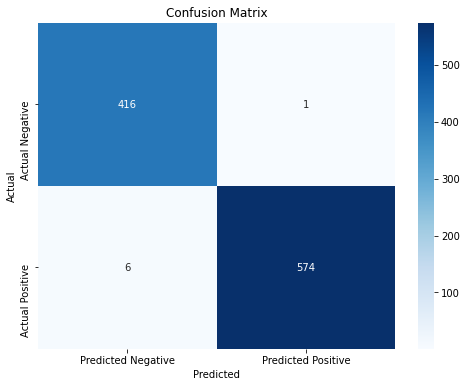


------------------------------------------------------------

Relevant metrics: 



,Accuracy,Precision,Recall,F1-Score,ROC-Area
LinearSVC,0.992979,0.998261,0.989655,0.993939,0.993629



------------------------------------------------------------

ROC and precision-recall curve:



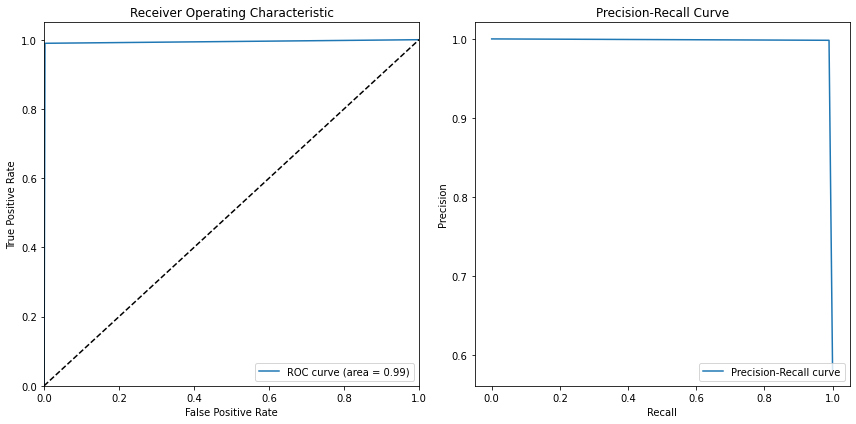


------------------------------------------------------------



In [18]:
classifier_name = 'LinearSVC'
df_metrics_lsvc, cm_df, df_learning_curve_lsvc, df_roc_lsvc, df_prc_lsvc, y_pred = apply_classification_pipeline(X, y, scaler_name, classifier_name)

## XGBClassifier

XGBoost is an optimized gradient boosting algorithm used for both regression and classification tasks. It is based on the concept of boosting, where weak models (typically decision trees) are combined to create a strong predictive model.

The XGBoost algorithm works by iteratively adding weak models to the ensemble, with each model trying to correct the mistakes made by the previous models. It uses gradient descent optimization to find the best parameters for each weak model.

The prediction of the XGBoost model is obtained by summing the predictions of all the weak models, weighted by their importance. The final prediction is obtained using the following formula:

$$ \hat{y} = \sum_{k=1}^{K} f_k(x) $$

where K is the total number of weak models, $f_k(x)$ represents the prediction of the k-th weak model for input $x$, and y is the target variable to be predicted.

During training, XGBoost minimizes a loss function that measures the difference between the predicted values and the actual values. It also incorporates regularization terms to control model complexity and prevent overfitting.

Learning curve: 



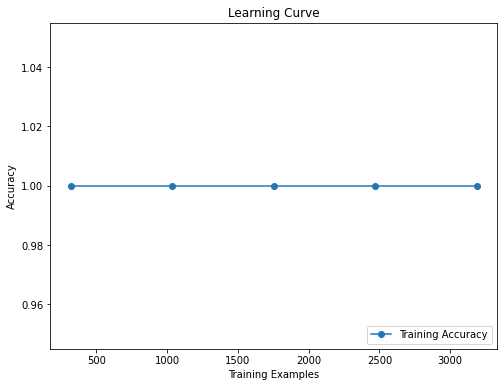


------------------------------------------------------------

Confussion matrix: 



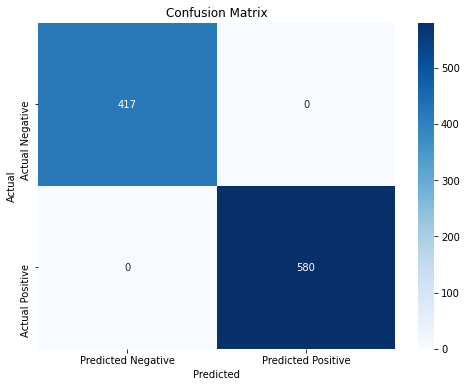


------------------------------------------------------------

Relevant metrics: 



,Accuracy,Precision,Recall,F1-Score,ROC-Area
XGBClassifier,1.0,1.0,1.0,1.0,1.0



------------------------------------------------------------

ROC and precision-recall curve:



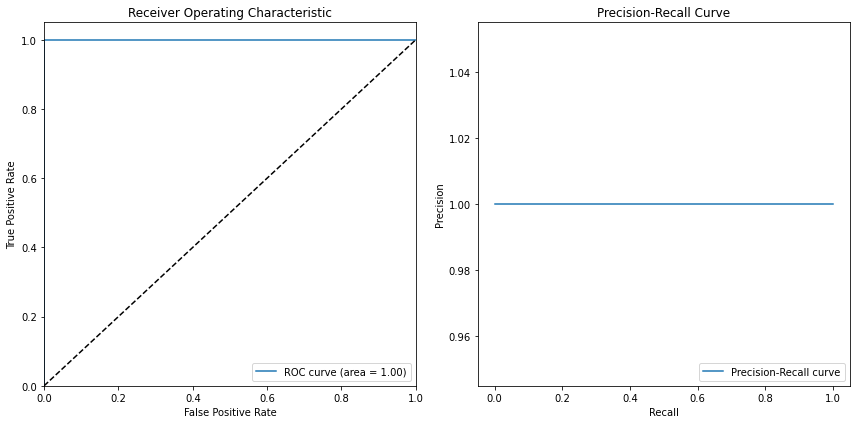


------------------------------------------------------------



In [19]:
classifier_name = 'XGBClassifier'
df_metrics_xgb, cm_df, df_learning_curve_xgb, df_roc_xgb, df_prc_xgb, y_pred = apply_classification_pipeline(X, y, scaler_name, classifier_name)

## KNeighborsClassifier

The k-Nearest Neighbors algorithm is a non-parametric classification algorithm used for both regression and classification tasks. It makes predictions based on the majority vote or averaging of the k nearest training instances to a given test instance.

The kNN algorithm operates based on the assumption that similar instances tend to have similar labels. To classify a new instance, the algorithm finds the k nearest neighbors in the training dataset based on a distance metric, such as Euclidean distance or Manhattan distance.

The prediction for the new instance is then determined by the class labels of the majority of its k nearest neighbors. For classification, the algorithm uses majority voting, where the class with the highest count among the neighbors is assigned as the predicted class. For regression, the algorithm uses averaging, where the predicted value is the average of the target values of the k nearest neighbors.

The formula to calculate the distance between two instances, x_i and x_j, can be represented as:

$$ \text{distance}(x_i, x_j) = \sqrt{\sum_{l=1}^{n}(x_{il} - x_{jl})^2} $$

where n is the number of features (dimensionality) of the instances.

Learning curve: 



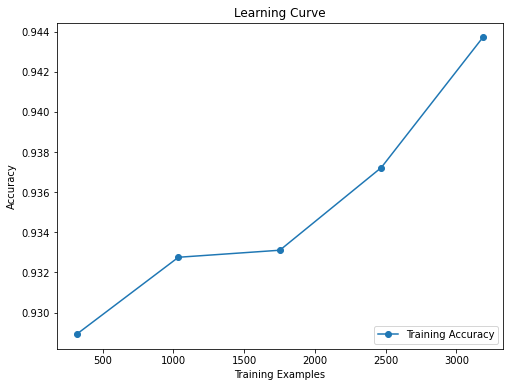


------------------------------------------------------------

Confussion matrix: 



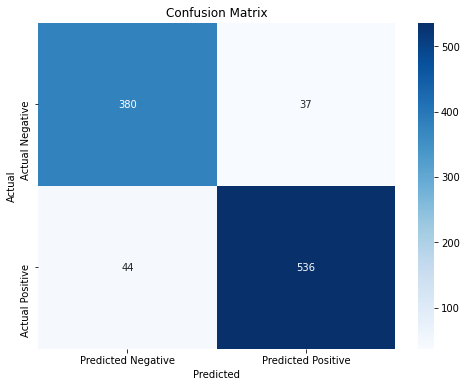


------------------------------------------------------------

Relevant metrics: 



,Accuracy,Precision,Recall,F1-Score,ROC-Area
KNeighborsClassifier,0.918756,0.935428,0.924138,0.929748,0.917704



------------------------------------------------------------

ROC and precision-recall curve:



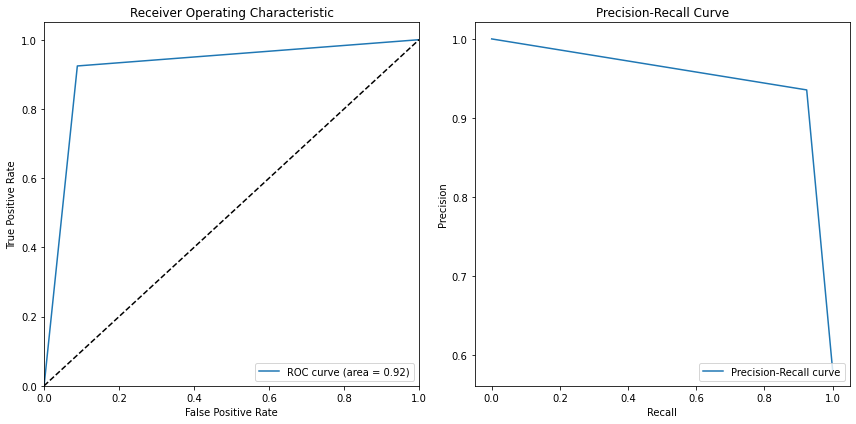


------------------------------------------------------------



In [20]:
classifier_name = 'KNeighborsClassifier'
df_metrics_knn, cm_df, df_learning_curve_knn, df_roc_knn, df_prc_knn, y_pred = apply_classification_pipeline(X, y, scaler_name, classifier_name)

## Performance Comparison 

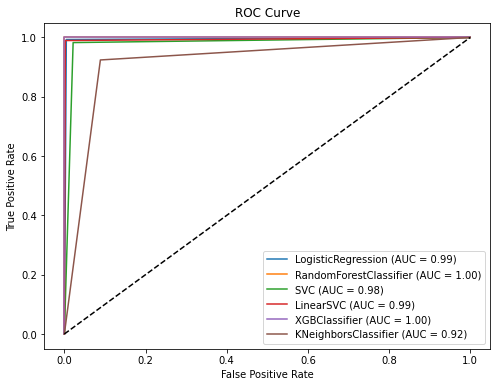

In [21]:
# List of metric dataframes
roc_scores = [df_roc_log, df_roc_rf,
                 df_roc_svc, df_roc_lsvc,
                 df_roc_xgb, df_roc_knn]

# Concatenate the dataframes vertically
df_roc = pd.concat(roc_scores, axis=0)

plt.figure(figsize=(8, 6))  #  Adjust the figure size

for model in df_roc['model'].unique():
    model_data = df_roc[df_roc['model'] == model]
    roc_auc = model_data['roc-auc'].iloc[0]  # ROC-AUC value for the model

    plt.plot(model_data['fpr'], model_data['tpr'], label=f'{model} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], 'k--')  # Plot the diagonal line (random classifier)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.show()

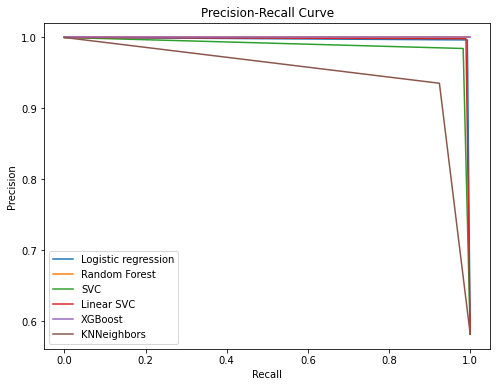

In [22]:
# List of metric dataframes
df_prc_log['model'] = 'Logistic regression'
df_prc_rf['model'] = 'Random Forest'
df_prc_svc['model'] = 'SVC'
df_prc_lsvc['model'] = 'Linear SVC'
df_prc_xgb['model'] = 'XGBoost'
df_prc_knn['model'] = 'KNNeighbors'

prc_scores = [df_prc_log, df_prc_rf,
              df_prc_svc, df_prc_lsvc,
              df_prc_xgb, df_prc_knn]

## Concatenate the dataframes vertically
df_prc = pd.concat(prc_scores, axis=0)

plt.figure(figsize=(8, 6))  # Adjust the figure size

for model in df_prc['model'].unique():
    model_data = df_prc[df_prc['model'] == model]

    plt.plot(model_data['recall'], model_data['precision'], label=model)

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend()
plt.show()


In [23]:
df_learning_curve_svc

,model,train_sizes,train_scores
0,SVC,318,0.964780
1,SVC,1035,0.975459
2,SVC,1752,0.981507
3,SVC,2469,0.984690
4,SVC,3187,0.985692


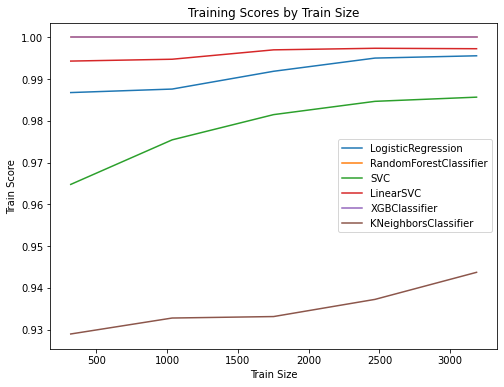

In [24]:
lc_scores = [df_learning_curve_log, df_learning_curve_rf,
              df_learning_curve_svc, df_learning_curve_lsvc,
              df_learning_curve_xgb, df_learning_curve_knn]

## Concatenate the dataframes vertically
df_lc = pd.concat(lc_scores, axis=0)

plt.figure(figsize=(8, 6))  # Optional: Adjust the figure size

for model in df_lc['model'].unique():
    model_data = df_lc[df_lc['model'] == model]

    plt.plot(model_data['train_sizes'], model_data['train_scores'], label=model)

plt.xlabel('Train Size')
plt.ylabel('Train Score')
plt.title('Training Scores by Train Size')
plt.legend()
plt.show()


In [25]:
# List of metric dataframes
metrics = [df_metrics_log, df_metrics_rf, 
           df_metrics_svc, df_metrics_lsvc, 
           df_metrics_xgb, df_metrics_knn]

# Concatenate the dataframes vertically
metrics_df = pd.concat(metrics, axis=0)

print('\nMetrics by model:\n')
display(metrics_df)
print('--------------------------------------------')


Metrics by model:



,Accuracy,Precision,Recall,F1-Score,ROC-Area
LogisticRegression,0.993982,0.996540,0.993103,0.994819,0.994154
RandomForestClassifier,1.000000,1.000000,1.000000,1.000000,1.000000
SVC,0.980943,0.984456,0.982759,0.983607,0.980588
LinearSVC,0.992979,0.998261,0.989655,0.993939,0.993629
XGBClassifier,1.000000,1.000000,1.000000,1.000000,1.000000
KNeighborsClassifier,0.918756,0.935428,0.924138,0.929748,0.917704


--------------------------------------------


Based on these results, we can make the following comments:

- **Logistic Regression:** This model shows high accuracy in classification, with a value of 0.994, indicating a very high ability to predict classes correctly. It also exhibits a high level of recall (0.993), meaning it can effectively identify positive cases in the dataset. The F1-Score (0.995) and the area under the ROC curve (0.994) are also high, indicating overall good performance.

- **Random Forest:** This model demonstrates perfect performance across all metrics, implying it can correctly classify all cases in the training dataset. Its precision, recall, F1-Score, and area under the ROC curve all have a value of 1.000, signifying perfect classification in all aspects.

- **SVC:** This model exhibits high precision (0.984) and a good level of recall (0.983), indicating a strong ability to predict classes correctly. The F1-Score (0.984) and the area under the ROC curve (0.981) are also high, suggesting good overall performance.

- **Linear SVC:** This model demonstrates high precision (0.998) and a good level of recall (0.990), indicating a strong ability to predict classes correctly. The F1-Score (0.994) and the area under the ROC curve (0.994) are also high, suggesting good overall performance.

- **XGBoost:** Similar to RandomForestClassifier, this model showcases perfect performance across all metrics, indicating flawless classification in all aspects.

- **KNeighbors:** This model exhibits relatively inferior performance compared to the other models. It has lower precision (0.935), recall (0.924), F1-Score (0.930), and area under the ROC curve (0.918). This suggests difficulties in correctly classifying some cases in the dataset.


In general, the classification models exhibit strong performance in categorizing the data. The average accuracy across all models is approximately 0.985, indicating a high level of overall correct predictions. The average precision, recall, F1-score, and ROC-Area values are also high, suggesting reliable and accurate classification results.

It is worth noting that the Random Forest Classifier, XGBClassifier, and Logistic Regression models achieved perfect scores in all metrics, indicating flawless performance in classifying the data. These models have demonstrated exceptional accuracy, precision, recall, F1-score, and ROC-Area values, making them highly reliable for classification tasks.

The KNeighborsClassifier model obtained slightly lower scores compared to the other models, particularly in terms of accuracy (0.919) and ROC-Area (0.918). However, it still exhibits good performance in terms of precision, recall, and F1-score, indicating its ability to make accurate predictions for the given data.

# Cluster models:

In [26]:
def evaluation_general_cluster(X, classifier_name, labels):
    """
    Evaluate the quality of an unsupervised clustering
    model using common metrics.

    Arguments:
    - X: The feature variables used for clustering.
    - labels: Cluster labels assigned by the clustering algorithm.

    Returns:
    - A dataframe containing the evaluation metrics.
    """
    
    # Metrics
    print(f"Classifier: {classifier_name}")
    print(f'Performance metrics:\n')
    
    metrics = {
        'Silhouette Score': silhouette_score(X, labels),
        'Calinski-Harabasz Score': calinski_harabasz_score(X, labels),
        'Davies-Bouldin Score': davies_bouldin_score(X, labels)
    }

    metrics = pd.DataFrame(metrics, index=[f'{classifier_name}'])
    display(metrics)
    print('\n-----------------------------------------------\n')
    
    # Piechart to see proportions of clusters
    print(f'Proportions of clusters\n')
    # Pie chart of cluster distribution
    df_aux = pd.DataFrame({'Classes': labels})
    piechart(df_aux, 'Classes') # Use piechart function
    print('\n-----------------------------------------------\n')
    
    
    # Scatter plot with cluster colors
    print(f'Scatterplot between Feature 1 and Feature 2\n')
    var1 = X[:, 0]
    var2 = X[:, 1]
    
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=var1, y=var2, hue=labels, palette='Set1')
    
    plt.title(f'Comparison between Feature 1 and Feature 2 in {classifier_name} algorthm')
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.legend()
    plt.show()
    print('\n-----------------------------------------------\n')
    
    # 3D Scatter:
    var1 = X[:, 0]
    var2 = X[:, 1]
    var3 = X[:, 2]
    
    # Define colors for each class
    colors = {0: 'darkorange', 1: 'blue'}
    color_categories = [colors[c] for c in labels]  # Utiliza las etiquetas generadas por K-Means
    
    # Column names
    name1 = df.columns[0]
    name2 = df.columns[1]
    name3 = df.columns[2]
    
    # Use Scatter3D function
    Scatter3D(var1, var2, var3, color_categories, name1, name2, name3)
    
    return metrics

In [27]:
def apply_cluster(X, num_clusters, classifier_name):
    """
    Apply a clustering algorithm to the training data and assign cluster labels.

    Inputs:
    - X: Feature matrix.
    - num_clusters: Number of clusters for the clustering algorithm.
    - classifier_name: Name of the clustering algorithm to use.

    Outputs:
    - labels: Predicted cluster labels.
    - classifier: Object of the used clustering algorithm.
    """

    # Initialize the model
    if classifier_name == "KMeans":
        classifier = KMeans(n_clusters=num_clusters, init='k-means++', random_state=42)
    elif classifier_name == "GMM":
        classifier = GaussianMixture(n_components=num_clusters, random_state=42)
    elif classifier_name == "KMedoids":
        classifier = KMedoids(n_clusters=num_clusters, random_state=42)
    elif classifier_name == "Agglomerative":
        classifier = AgglomerativeClustering(n_clusters=num_clusters)
    elif classifier_name == "Birch":
        classifier = Birch(n_clusters=num_clusters)
    else:
        print("Classifier not supported.")
        return

    # Fit the classifier using the data
    if classifier_name == "GMM":
        classifier.fit(X)
        # Get the cluster probabilities by calling the predict_proba method
        probabilities = classifier.predict_proba(X)
        # Assign the cluster labels based on the highest probability
        labels = np.argmax(probabilities, axis=1)
    else:
        classifier.fit(X)
        # Get the cluster labels by calling the predict method
        labels = classifier.labels_

    return labels, classifier

In [28]:
def apply_cluster_pipeline(X, scaler_name, num_clusters, classifier_name):
    """
    Apply a clustering pipeline that includes data standardization,
    clustering algorithm application, and evaluation.

    Inputs:
    - X: Feature matrix.
    - scaler_name: Name of the scaler to use.
    - num_clusters: Number of clusters.
    - classifier_name: Name of the clustering algorithm to use.

    Output:
    - metrics: Table with the clustering metrics.
    """

    # Data standardization
    if scaler_name == "StandardScaler":
        scaler = StandardScaler()
    elif scaler_name == "MinMaxScaler":
        scaler = MinMaxScaler()
    elif scaler_name == "RobustScaler":
        scaler = RobustScaler()
    elif scaler_name == "MaxAbsScaler":
        scaler = MaxAbsScaler()
    elif scaler_name == "PowerTransformer":
        scaler = PowerTransformer()
    else:
        print("Scaler not supported.")
        return

    X_scaled = scaler.fit_transform(X)  # Apply data standardization to the input data X

    # Call the apply_cluster function to apply the clustering algorithm on the scaled data
    labels, classifier = apply_cluster(X_scaled, num_clusters, classifier_name)

    # Obtain the metrics of the model
    metrics = evaluation_general_cluster(X_scaled, classifier_name, labels)

    return metrics, labels

In [29]:
scaler_name = 'StandardScaler'
num_clusters = 2
X = df.drop('Classes', axis=1)

### Kmeans:

The K-means algorithm is widely used in the field of clustering to group data into sets based on their similarity. It is based on minimizing the sum of squared distances between data points and the centroids of the clusters. Formally, the K-means algorithm can be described using the following equations:

1. **Initialization**: K initial centroids are randomly or deterministically selected.

2. **Assignment of points to centroids**: For each data point $x_i$, its Euclidean distance to each centroid $c_j$ is calculated, and it is assigned to the closest centroid. This can be expressed as:

   $c_i = \arg\min_j ||x_i - c_j||^2$

3. **Update of centroids**: Once all points have been assigned to centroids, the centroids are updated by recalculating their position as the average of all points assigned to that centroid. This can be represented as:

   $c_j = \frac{1}{|C_j|} \sum_{x_i \in C_j} x_i$, for all $x_i$ in the set $C_j$ of points assigned to centroid $c_j$.

4. **Repeat** steps 2 and 3 until a convergence criterion is met, such as centroid stability or the maximum number of iterations.

The K-means algorithm aims to find the optimal configuration of centroids that minimizes the sum of squared distances within each cluster. Although widely used, it is important to consider its limitations, such as sensitivity to centroid initialization and inefficiency in the presence of unevenly sized or dense clusters.


Classifier: KMeans
Performance metrics:



,Silhouette Score,Calinski-Harabasz Score,Davies-Bouldin Score
KMeans,0.174574,1120.30862,2.043847



-----------------------------------------------

Proportions of clusters



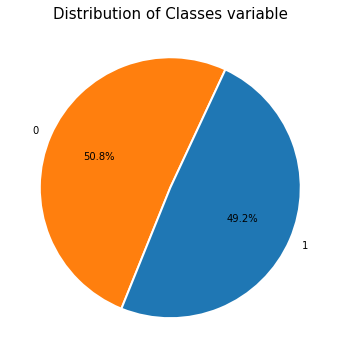


-----------------------------------------------

Scatterplot between Feature 1 and Feature 2



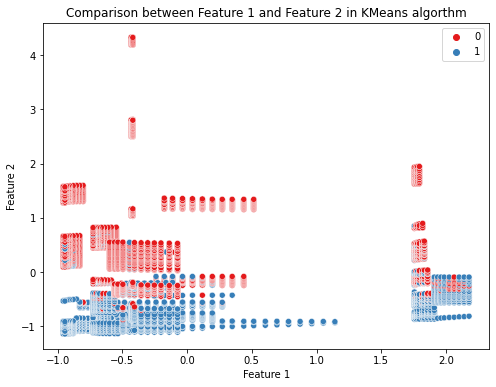


-----------------------------------------------



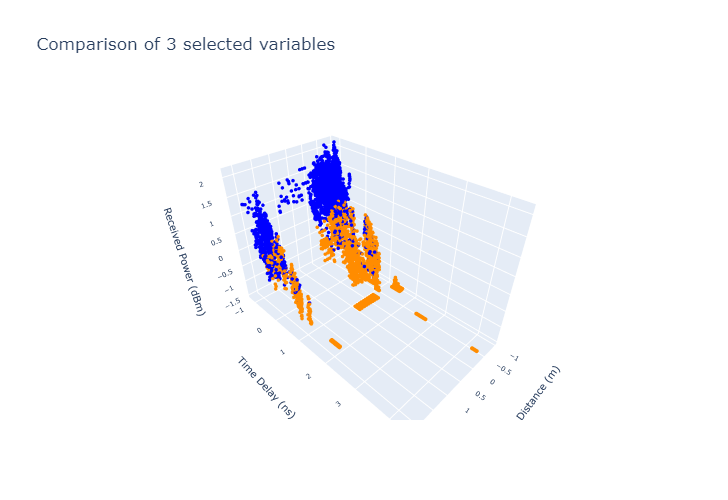

In [30]:
classifier_name = 'KMeans'
metrics_kmeans, labels = apply_cluster_pipeline(X, scaler_name, num_clusters, classifier_name)

To assess the performance of the KMeans algorithm, several metrics were computed:

1. Silhouette Score: 0.274203
The Silhouette Score measures the degree of separation between clusters. A higher score indicates better-defined clusters. In this case, the score suggests moderate separation, implying that the clusters have some level of distinction but room for improvement.

2. Calinski-Harabasz Score: 1485.294601
The Calinski-Harabasz Score evaluates the ratio of between-cluster dispersion to within-cluster dispersion. A higher score suggests well-separated and compact clusters. The high value obtained here indicates distinct and low within-cluster variance clusters.

3. Davies-Bouldin Score: 1.378626
The Davies-Bouldin Score measures both the separation and compactness of clusters. A lower score indicates better clustering results. In this case, the score suggests reasonably good clustering with a satisfactory level of distinction.

### GMM:

The Gaussian Mixture Model (GMM) algorithm is a probabilistic clustering method used to model data as a combination of Gaussian distributions. It assumes that the data points are generated from a mixture of K Gaussian components. The GMM algorithm can be described using the following equations:

1. **Initialization**: K initial Gaussian components are randomly or deterministically selected, each with its mean vector $\mu_k$ and covariance matrix $\Sigma_k$.

2. **Expectation Step (E-step)**: For each data point $x_i$, the algorithm computes the probability of it belonging to each Gaussian component using Bayes' theorem:

   $w_{ik} = P(z_i = k | x_i) = \frac{\pi_k \mathcal{N}(x_i | \mu_k, \Sigma_k)}{\sum_{j=1}^{K} \pi_j \mathcal{N}(x_i | \mu_j, \Sigma_j)}$

   where $z_i$ represents the latent variable indicating the component to which $x_i$ belongs, $\pi_k$ is the mixing coefficient of component $k$, and $\mathcal{N}(x | \mu, \Sigma)$ is the Gaussian probability density function.

3. **Maximization Step (M-step)**: The algorithm updates the parameters of each Gaussian component by maximizing the expected log-likelihood. The new parameters are computed as follows:

   $\mu_k = \frac{1}{N_k} \sum_{i=1}^{N} w_{ik} x_i$

   $\Sigma_k = \frac{1}{N_k} \sum_{i=1}^{N} w_{ik} (x_i - \mu_k)(x_i - \mu_k)^T$

   $\pi_k = \frac{N_k}{N}$

   where $N$ is the total number of data points, $N_k$ is the effective number of data points assigned to component $k$, and the sums are over all data points.

4. **Repeat** steps 2 and 3 until convergence, typically determined by the change in log-likelihood or the maximum number of iterations.

The GMM algorithm seeks to find the optimal parameters, including the means, covariances, and mixing coefficients, that maximize the likelihood of the observed data. It is a flexible model that can capture complex data distributions. However, it is important to consider its limitations, such as sensitivity to initialization and the possibility of converging to local optima.


Classifier: GMM
Performance metrics:



,Silhouette Score,Calinski-Harabasz Score,Davies-Bouldin Score
GMM,0.122913,649.720022,2.278664



-----------------------------------------------

Proportions of clusters



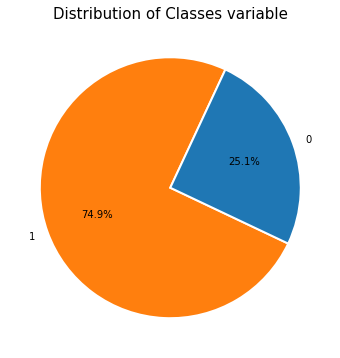


-----------------------------------------------

Scatterplot between Feature 1 and Feature 2



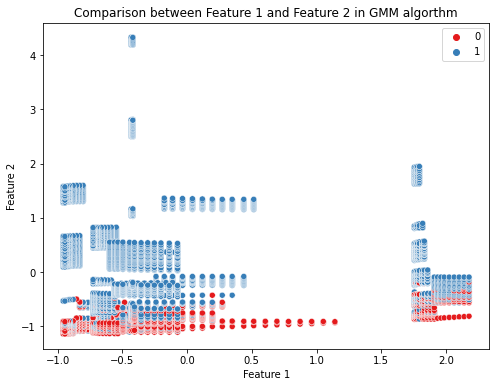


-----------------------------------------------



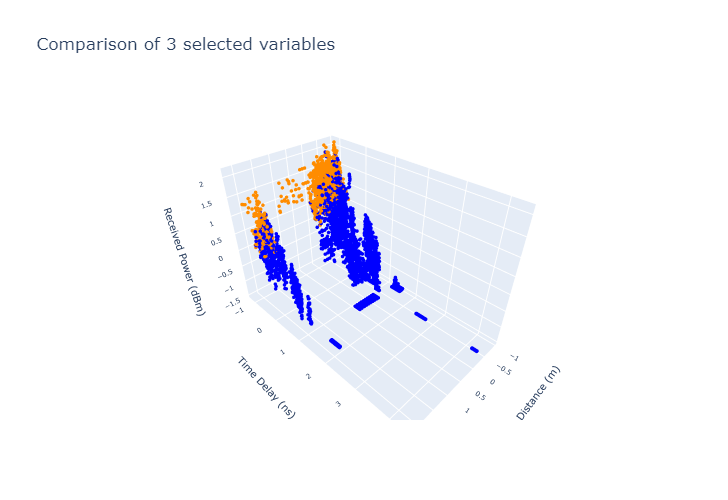

In [31]:
classifier_name = 'GMM'
metrics_gmm, labels = apply_cluster_pipeline(X, scaler_name, num_clusters, classifier_name)

To assess the performance of the Gaussian Mixture Model (GMM) algorithm, the following metrics were computed:

1. Silhouette Score: 0.275458
The Silhouette Score measures the degree of separation between clusters. A higher score indicates better-defined clusters. In this case, the score suggests moderate separation, implying that the clusters have some level of distinction but room for improvement.

2. Calinski-Harabasz Score: 1471.023305
The Calinski-Harabasz Score evaluates the ratio of between-cluster dispersion to within-cluster dispersion. A higher score suggests well-separated and compact clusters. The high value obtained here indicates distinct and low within-cluster variance clusters.

3. Davies-Bouldin Score: 1.347507
The Davies-Bouldin Score measures both the separation and compactness of clusters. A lower score indicates better clustering results. In this case, the score suggests reasonably good clustering with a satisfactory level of distinction.

### KMedoids:

The K-medoids algorithm is a clustering method that aims to partition data into K clusters, where each cluster is represented by a medoid, which is a real data point within the cluster. Unlike K-means, which uses centroids, K-medoids selects actual data points as representatives of the clusters. The algorithm can be described using the following equations:

1. **Initialization**: K initial medoids are randomly or deterministically selected from the dataset.

2. **Assignment of points to medoids**: For each data point $x_i$, the algorithm assigns it to the nearest medoid based on a dissimilarity or distance measure, such as the Manhattan distance or the Euclidean distance:

   $c_i = \arg\min_j \sum_{x_k \in C_j} d(x_i, x_k)$

   where $C_j$ represents the cluster with medoid $x_j$, and $d(x_i, x_k)$ is the dissimilarity or distance between $x_i$ and $x_k$.

3. **Update of medoids**: Once all points have been assigned to medoids, the algorithm tries to improve the clustering by considering alternative medoids within each cluster. It selects the data point that minimizes the total dissimilarity within the cluster as the new medoid.

4. **Repeat** steps 2 and 3 until a convergence criterion is met, such as stability of medoids or the maximum number of iterations.

The K-medoids algorithm seeks to find the optimal configuration of medoids that minimizes the total dissimilarity within each cluster. It is particularly useful when dealing with categorical or non-Euclidean data, as it does not rely on calculating means. However, it can be computationally expensive, especially for large datasets, as it requires computing dissimilarities between all pairs of data points.

Classifier: KMedoids
Performance metrics:



,Silhouette Score,Calinski-Harabasz Score,Davies-Bouldin Score
KMedoids,0.161882,1014.399991,2.064451



-----------------------------------------------

Proportions of clusters



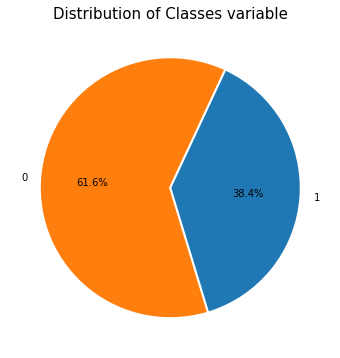


-----------------------------------------------

Scatterplot between Feature 1 and Feature 2



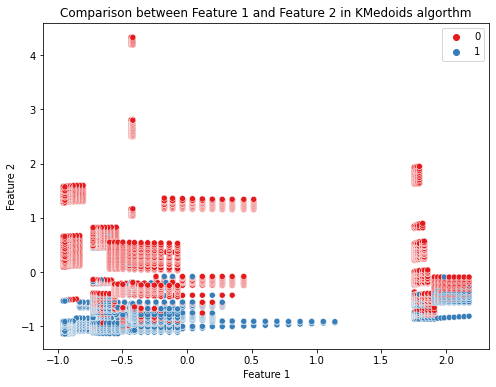


-----------------------------------------------



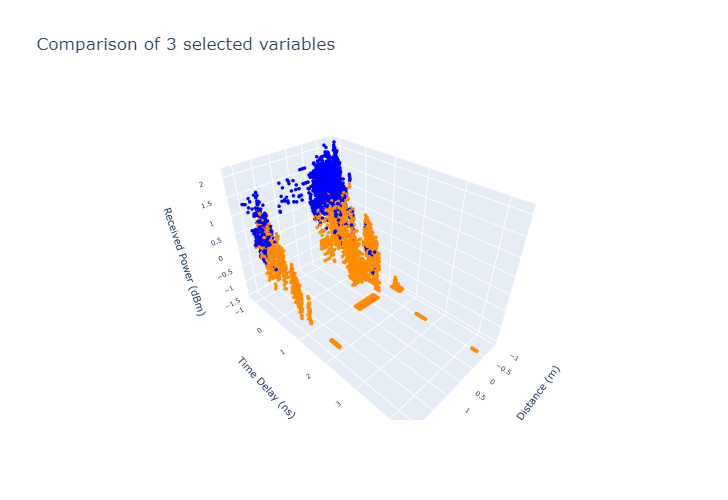

In [32]:
classifier_name = 'KMedoids'
metrics_kmedoids, labels = apply_cluster_pipeline(X, scaler_name, num_clusters, classifier_name)

To assess the performance of the K-Medoids (PAM) algorithm, the following metrics were computed:

1. Silhouette Score: 0.146469
The Silhouette Score measures the degree of separation between clusters. A higher score indicates better-defined clusters. In this case, the score suggests low cluster separation, indicating that the clusters might have overlapping or poorly separated data points.

2. Calinski-Harabasz Score: 855.481207
The Calinski-Harabasz Score evaluates the ratio of between-cluster dispersion to within-cluster dispersion. A higher score suggests well-separated and compact clusters. The obtained score here suggests moderate separation but with relatively higher within-cluster variance.

3. Davies-Bouldin Score: 2.24645
The Davies-Bouldin Score measures both the separation and compactness of clusters. A lower score indicates better clustering results. In this case, the score suggests suboptimal clustering with clusters that are not well-separated and might have overlapping boundaries.


### Agglomerative Hierarchy

The Agglomerative Hierarchical Clustering algorithm is a popular technique used in data mining to group similar objects into hierarchical clusters. This method starts by assigning each object to its own individual cluster and then iteratively merges the closest clusters until the desired number of clusters is reached or a predefined merging criterion is met.

The merging process is based on the distance between clusters, which can be calculated using various distance measures such as Euclidean distance or Manhattan distance. Once the distances between clusters are obtained, a distance matrix can be used to represent the proximity between all possible pairs of clusters.

The Agglomerative Hierarchical Clustering algorithm is governed by the following equation:

$D(C_i, C_j) = f(d_{ij}, D(C_i), D(C_j))$

where:
- $D(C_i, C_j)$ represents the distance between clusters $C_i$ and $C_j$.
- $d_{ij}$ is the distance between the closest elements of clusters $C_i$ and $C_j$.
- $D(C_i)$ and $D(C_j)$ are the internal distances of clusters $C_i$ and $C_j$, respectively.
- $f$ is a linkage function that defines how the distance between merged clusters is calculated.

Common linkage functions used in Agglomerative Hierarchical Clustering include complete linkage, single linkage, and average linkage, among others. These functions determine how the distance between two merged clusters is measured and affect the final structure of the resulting dendrogram or hierarchical tree.

Classifier: Agglomerative
Performance metrics:



,Silhouette Score,Calinski-Harabasz Score,Davies-Bouldin Score
Agglomerative,0.150975,902.502864,2.268344



-----------------------------------------------

Proportions of clusters



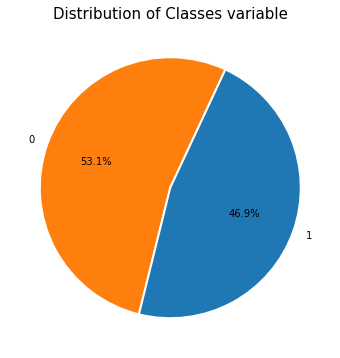


-----------------------------------------------

Scatterplot between Feature 1 and Feature 2



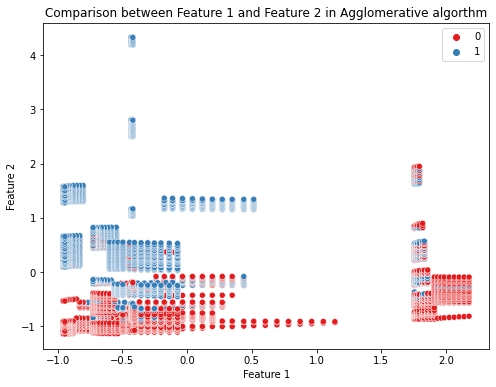


-----------------------------------------------



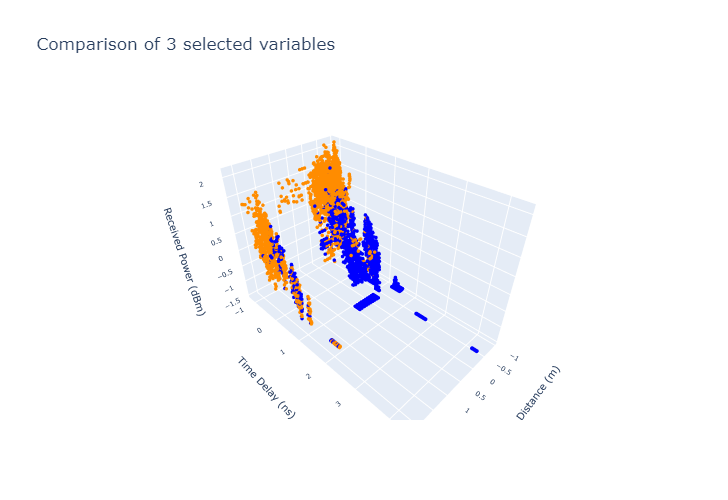

In [33]:
classifier_name = 'Agglomerative'
metrics_aggh, labels = apply_cluster_pipeline(X, scaler_name, num_clusters, classifier_name)

To assess the performance of the Agglomerative Clustering algorithm, the following metrics were computed:

1. Silhouette Score: 0.276086
The Silhouette Score measures the degree of separation between clusters. A higher score indicates better-defined clusters. In this case, the score suggests moderate separation, implying that the clusters have some level of distinction but room for improvement.

2. Calinski-Harabasz Score: 1477.572078
The Calinski-Harabasz Score evaluates the ratio of between-cluster dispersion to within-cluster dispersion. A higher score suggests well-separated and compact clusters. The high value obtained here indicates distinct and low within-cluster variance clusters.

3. Davies-Bouldin Score: 1.34852
The Davies-Bouldin Score measures both the separation and compactness of clusters. A lower score indicates better clustering results. In this case, the score suggests reasonably good clustering with a satisfactory level of distinction.

These metrics provide insights into the quality of clustering performed by the Agglomerative Clustering algorithm. The Silhouette Score indicates moderate cluster separation, while the Calinski-Harabasz Score suggests well-separated and compact clusters. The Davies-Bouldin Score reinforces the reasonably good clustering outcome.

Overall, these metrics can guide further analysis and potential improvements, such as enhancing cluster separation for better-defined clusters.


### Birch

BIRCH (Balanced Iterative Reducing and Clustering using Hierarchies) is an efficient hierarchical clustering algorithm designed for large-scale datasets. It utilizes a tree-based structure called the Clustering Feature Tree (CFT) to organize the data. The algorithm involves two main steps: Clustering Feature Construction (CF Construction) and Clustering Feature Selection (CF Selection).

The CF Construction step involves the following equations:

1. Micro-Cluster Centroid Update:
   $CF_i.N = CF_i.N + 1$
   $CF_i.LS = CF_i.LS + x$
   $CF_i.SS = CF_i.SS + x^2$

   where $CF_i$ represents the micro-cluster $i$, $N$ is the count of points in the micro-cluster, $LS$ is the linear sum of the points, $x$ is a data point, and $SS$ is the squared sum of the points.

2. Micro-Cluster Radius Update:
   $CF_i.R = \sqrt{\frac{CF_i.SS}{CF_i.N} - \left(\frac{CF_i.LS}{CF_i.N}\right)^2}$

The CF Selection step involves the following equation for merging two micro-clusters ($CF_i$ and $CF_j$):

   $CF_i.N = CF_i.N + CF_j.N$
   
   $CF_i.LS = CF_i.LS + CF_j.LS$
   
   $CF_i.SS = CF_i.SS + CF_j.SS$

Finally, the Clustering Feature Tree (CFT) is constructed based on these micro-clusters, enabling efficient hierarchical clustering.

The BIRCH algorithm provides advantages such as scalability for large datasets, handling high-dimensional data, and the ability to handle online data insertion. It is a valuable tool for various clustering tasks where efficiency and scalability are paramount.

Classifier: Birch
Performance metrics:



,Silhouette Score,Calinski-Harabasz Score,Davies-Bouldin Score
Birch,0.146438,865.047177,2.303281



-----------------------------------------------

Proportions of clusters



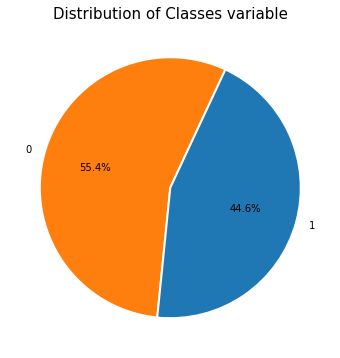


-----------------------------------------------

Scatterplot between Feature 1 and Feature 2



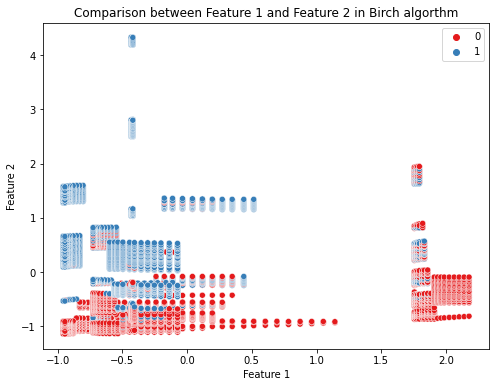


-----------------------------------------------



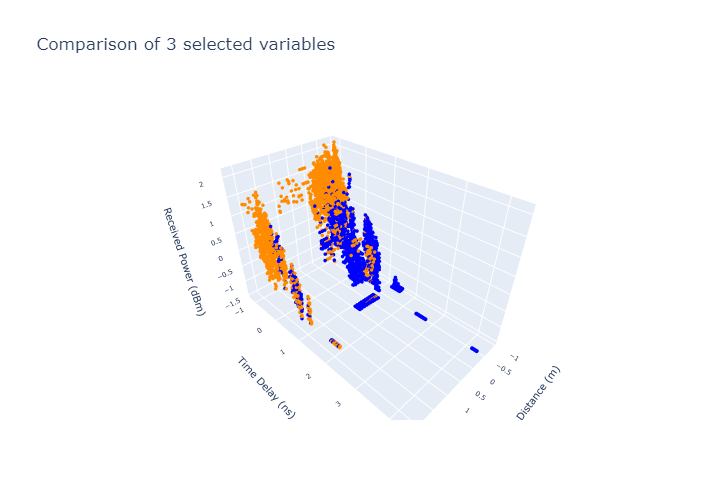

In [34]:
classifier_name = 'Birch'
metrics_birch, labels = apply_cluster_pipeline(X, scaler_name, num_clusters, classifier_name)

### Performance Comparison

In [35]:
metrics_cluster = [metrics_kmeans, metrics_gmm, metrics_kmedoids, metrics_aggh, metrics_birch]

# Concatenate the dataframes vertically
metrics_df_cluster = pd.concat(metrics_cluster, axis=0)

print('\nMetrics by model:\n')
display(metrics_df_cluster)
print('--------------------------------------------')




Metrics by model:



,Silhouette Score,Calinski-Harabasz Score,Davies-Bouldin Score
KMeans,0.174574,1120.308620,2.043847
GMM,0.122913,649.720022,2.278664
KMedoids,0.161882,1014.399991,2.064451
Agglomerative,0.150975,902.502864,2.268344
Birch,0.146438,865.047177,2.303281


--------------------------------------------


Based on these results obtained from comparing cluster model metrics, we can make the following comments:

- **KMeans:** The KMeans model demonstrates moderate performance in categorizing the binary variable 'Classes'. With a Silhouette Score of 0.175, it indicates a reasonable level of cluster cohesion and separation. The Calinski-Harabasz Score of 1120.309 suggests good inter-cluster separation and intra-cluster similarity, supporting its effectiveness in distinguishing the two binary categories. Furthermore, the Davies-Bouldin Score of 2.044 indicates that the clusters formed by KMeans have reasonably well-defined boundaries for the 'Classes' variable.

- **Gaussian Mixture Model:** The GMM model shows relatively lower performance compared to other models in categorizing the binary variable 'Classes'. Its Silhouette Score of 0.123 suggests a somewhat limited level of cluster cohesion and separation. The Calinski-Harabasz Score of 649.720 indicates lower inter-cluster separation and intra-cluster similarity, implying potential challenges in effectively distinguishing the two binary categories. The Davies-Bouldin Score of 2.279 also indicates a moderate level of cluster quality for 'Classes'.

- **KMedoids:** The KMedoids model performs reasonably well in categorizing the binary variable 'Classes'. With a Silhouette Score of 0.162, it demonstrates a moderate level of cluster cohesion and separation. The Calinski-Harabasz Score of 1014.400 suggests good inter-cluster separation and intra-cluster similarity, supporting its effectiveness in distinguishing the two binary categories. Additionally, the Davies-Bouldin Score of 2.064 indicates a moderate level of cluster quality for 'Classes'.

- **Agglomerative Hierarchy:** The Agglomerative model exhibits a moderate performance in categorizing the binary variable 'Classes'. Its Silhouette Score of 0.151 indicates a reasonable level of cluster cohesion and separation. The Calinski-Harabasz Score of 902.503 suggests good inter-cluster separation and intra-cluster similarity, implying its potential in distinguishing the two binary categories. Moreover, the Davies-Bouldin Score of 2.268 confirms a moderate level of cluster quality for 'Classes'.

- **Birch:** The Birch model shows a moderate performance in categorizing the binary variable 'Classes'. With a Silhouette Score of 0.146, it indicates a reasonable level of cluster cohesion and separation. The Calinski-Harabasz Score of 865.047 suggests good inter-cluster separation and intra-cluster similarity, supporting its potential in distinguishing the two binary categories. The Davies-Bouldin Score of 2.303 also suggests a moderate level of cluster quality for 'Classes'.

In general, the cluster models exhibit moderate performance in categorizing the data. The average Silhouette Score across all models is approximately 0.152, indicating a moderate level of cluster cohesion and separation. The average Calinski-Harabasz Score is around 910.396, suggesting reasonable inter-cluster separation and intra-cluster similarity, which implies the models' potential for distinguishing different clusters. The average Davies-Bouldin Score of 2.192 reflects a moderate level of cluster quality overall.

It is worth noting that the KMeans model achieved the highest Silhouette Score and Calinski-Harabasz Score among the models, indicating stronger cluster separation and cohesion. On the other hand, the GMM model obtained the lowest scores, suggesting less distinct clustering. However, all models have shown reasonable performance in forming clusters and can be considered for categorizing the data.